In [757]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import seaborn.objects as so
import plotly.graph_objects as go 
import warnings 
warnings.filterwarnings('ignore') 
import os
import plotly.express as px
import geopandas as gpd


In [758]:
#load the data
#df = pd.read_csv('openaq1.csv', sep=';', on_bad_lines='skip')
df = pd.read_csv('openaqf.csv', sep=';', on_bad_lines='skip')
#df = pd.read_csv('openaq.csv', encoding='ISO-8859-1')
df.head()

,Country Code,City,Location,Coordinates,Pollutant,Source Name,Unit,Value,Last Updated,Country Label
0,IT,via Pecorelli - Civitavecchia (RM),Civitavecchia- Villa Albani,"42.09929600025972, 11.798339999946897",NO2,eea,µg/m³,34.00,2024-04-13T10:00:00+03:00,Italy
1,IT,Area industriale - Polla (SA),Polla Area tritovagliatore,"40.48700999991416, 15.528249999904329",SO2,eea,µg/m³,1.35,2024-04-13T10:00:00+03:00,Italy
2,IT,via dei Normanni 90 - Acerra (NA),Acerra Zona Industriale,"40.979710000224664, 14.400999999874841",CO,eea,µg/m³,210.00,2024-03-11T12:00:00+02:00,Italy
3,IT,via Tagliamonte 18 - Torre Annunziata (NA),Torre Annunziata Scuola Media Pascoli,"40.760599999960604, 14.438150000027823",O3,eea,µg/m³,89.23,2024-04-13T10:00:00+03:00,Italy
4,IT,via Epomeo - Napoli (NA),Tirrenopower Via Epomeo,"40.84495000021116, 14.205670000204075",PM10,eea,µg/m³,26.81,2024-04-13T10:00:00+03:00,Italy


In [759]:
#data prepeartion
df[['Latitude', 'Longitude']] = df['Coordinates'].str.split(', ', expand=True).astype(float)
df['Last Updated'] = pd.to_datetime(df['Last Updated'], errors='coerce', utc=True)
df['Last Updated'] = pd.to_datetime(df['Last Updated'])
df['Year'] = df['Last Updated'].dt.year
df['Month'] = df['Last Updated'].dt.month
df['Day'] = df['Last Updated'].dt.day
df['Hour'] = df['Last Updated'].dt.hour
df['Date'] = df['Last Updated'].map(lambda x: x.strftime('%Y-%m-%d'))


In [760]:
# Dictionary to convert ppm to µg/m3 

dict_conv = {'CO': 1150,
             'NO': 1230,
             'NO2': 1880,
             'O3': 1960,
             'SO2': 2620,
             'NOX': 1880}

df.loc[df['Unit']=='ppm', 'Conversion'] = df.loc[df['Unit']=='ppm', 'Pollutant'].map(dict_conv)

df.loc[df['Unit']=='ppm', 'Value_standard'] = df.loc[df['Unit']=='ppm', 'Conversion'] * df.loc[df['Unit']=='ppm', 'Value']
df.loc[df['Unit']=='µg/m³', 'Value_standard'] = df.loc[df['Unit']=='µg/m³', 'Value']

In [761]:
pol_levels_good = {'CO': 4,
                   'NO2': 25,
                   'O3': 100,
                   'SO2': 40,
                   'PM2.5': 15,
                   'PM10': 45}

pol_levels_bad =  {'CO': 7,
                   'NO2': 120,
                   'O3': 160,
                   'SO2': 125,
                   'PM2.5': 75,
                   'PM10': 150}

In [762]:
df.loc[:, 'Good_threshold'] = df.loc[:, 'Pollutant'].map(pol_levels_good)
df.loc[:, 'Bad_threshold'] = df.loc[:, 'Pollutant'].map(pol_levels_bad)

df.loc[df['Value_standard']<=df['Good_threshold'], 'Quality'] = 'Good'
df.loc[df['Value_standard']>df['Bad_threshold'], 'Quality'] = 'Bad'
df.loc[(df['Value_standard']<=df['Bad_threshold'])
       & (df['Value_standard']>df['Good_threshold']), 'Quality'] = 'Regular'

In [763]:
# Distinguish column types for tailored analysis
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()

print(f"Numerical Columns: {numerical_cols}")
print(f"Categorical Columns: {categorical_cols}")

Numerical Columns: ['Value', 'Latitude', 'Longitude', 'Year', 'Month', 'Day', 'Hour', 'Conversion', 'Value_standard', 'Good_threshold', 'Bad_threshold']
Categorical Columns: ['Country Code', 'City', 'Location', 'Coordinates', 'Pollutant', 'Source Name', 'Unit', 'Last Updated', 'Country Label', 'Date', 'Quality']


In [764]:
#df.groupby(['Pollutant', 'Unit'])['Value_standard'].describe()

In [765]:
df = df[df['Value_standard']>=0]

In [766]:
df.groupby(['Pollutant', 'Unit'])['Value_standard'].describe()

count         mean            std  min         25%  \
Pollutant Unit                                                         
BC        µg/m³   133.0     0.890221       1.021795  0.0    0.295740   
CO        ppm    1266.0  3843.715119   60727.965552  0.0  230.000000   
          µg/m³  3868.0  8602.059600  109333.745072  0.0  310.000000   
NO        ppm    1963.0     4.832671      35.495772  0.0    0.000000   
          µg/m³  1785.0     9.806679      23.361679  0.0    1.000000   
NO2       ppm    2830.0   192.922856    3992.075226  0.0    5.640000   
          µg/m³  7076.0    21.537683      28.255313  0.0    8.000000   
NOX       ppm    1892.0    24.963071      58.232462  0.0    7.520000   
          µg/m³   118.0    27.628041      33.784041  1.0    8.209515   
O3        ppm    2809.0    80.862791     481.779901  0.0   43.120000   
          µg/m³  5553.0    73.624951      71.638903  0.0   29.121200   
PM1       µg/m³   125.0    20.099357      23.603129  0.0    4.064732   
PM10      µg/m³  7950.0    40.669056      81.282741  0.0   14.000000   
PM2.5     µg/m³  9328.0    19.406622      40.323681  0.0    5.682500   
SO2       ppm    2147.0   125.219810    2954.878349  0.0    0.262000   
          µg/m³  4747.0     9.368765      53.839090  0.0    2.450000   

                        50%         75%           max  
Pollutant Unit                                         
BC        µg/m³    0.510000    1.187980  5.498820e+00  
CO        ppm    345.000000  596.726375  1.428712e+06  
          µg/m³  514.500000  800.000000  3.198676e+06  
NO        ppm      1.230000    2.826540  1.395312e+03  
          µg/m³    2.051500    7.791500  3.777000e+02  
NO2       ppm     13.137440   24.440000  1.359035e+05  
          µg/m³   15.000000   27.281150  1.010644e+03  
NOX       ppm     15.040000   30.080000  2.136244e+03  
          µg/m³   19.359020   31.960775  2.326053e+02  
O3        ppm     74.480000   97.020000  2.548000e+04  
          µg/m³   58.000000   99.000000  2.004076e+03  
PM1       µg/m³   13.241071   30.125000  1.697768e+02  
PM10      µg/m³   24.728563   42.000000  3.011492e+03  
PM2.5     µg/m³   11.000000   20.210000  1.060000e+03  
SO2       ppm      2.620000    6.026000  1.288555e+05  
          µg/m³    5.000000    8.195000  3.052620e+03

In [767]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53590 entries, 0 to 55257
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   Country Code    53590 non-null  object             
 1   City            29766 non-null  object             
 2   Location        53588 non-null  object             
 3   Coordinates     53524 non-null  object             
 4   Pollutant       53590 non-null  object             
 5   Source Name     53590 non-null  object             
 6   Unit            53590 non-null  object             
 7   Value           53590 non-null  float64            
 8   Last Updated    53590 non-null  datetime64[ns, UTC]
 9   Country Label   53479 non-null  object             
 10  Latitude        53524 non-null  float64            
 11  Longitude       53524 non-null  float64            
 12  Year            53590 non-null  int64              
 13  Month           53590 non-null 

In [768]:
index = ['Country Code',
         'Country Label',
         'Source Name', 
         'Last Updated',
         'Latitude', 
         'Longitude', 
         'Year',
         'Month', 
         'Day', 
         'Hour', 
         'Date',
        'Quality']


df_pivot = df.pivot_table(index=index,
                          columns='Pollutant',
                          values='Value_standard',
                          aggfunc='max').reset_index()

index_date = index
index_date.remove('Hour')
index_date.remove('Last Updated')

df_pivot_date = df.pivot_table(index=index_date,
                               columns='Pollutant',
                               values='Value_standard',
                               aggfunc='max').reset_index()

In [769]:
#df_pivot.head()

In [770]:
#df_pivot.info()

In [771]:
#fig = px.scatter_matrix(df_pivot,
#    dimensions=["CO", "NO", "NO2", "NOX", "O3", "PM10", "PM2.5", "SO2"])
#fig.show()

In [772]:
#corr_pollutants = df_pivot[['BC', 'CO', 'NO', 'NO2', 'NOX', 'O3', 'PM1', 'PM10', 'PM2.5', 'SO2']].corr(numeric_only=True)

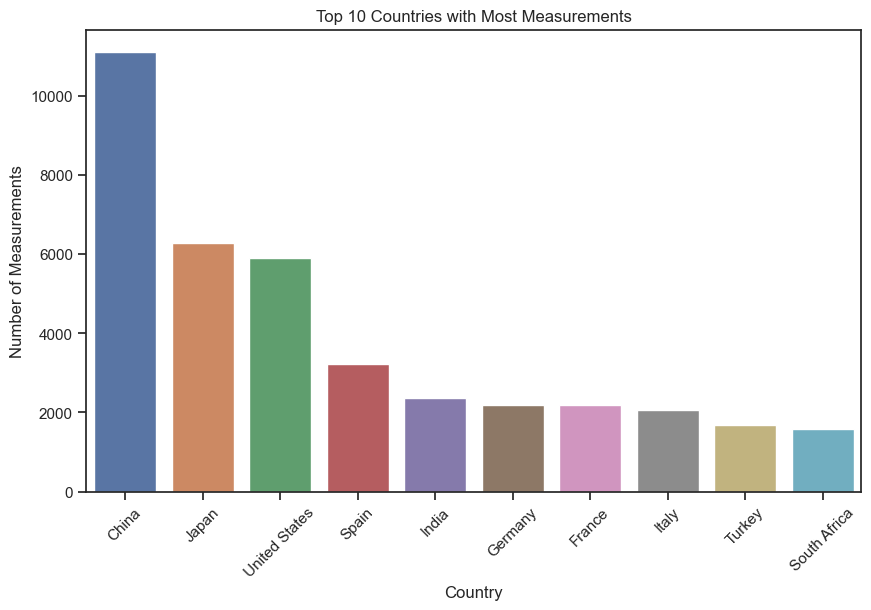

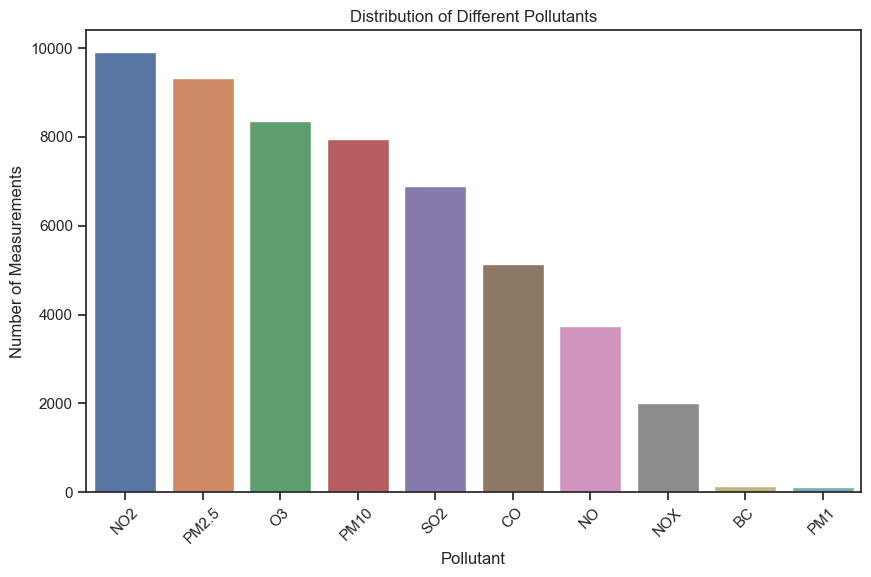

In [773]:
plt.figure(figsize=(10, 6))
top_countries = df['Country Label'].value_counts().head(10)
sns.barplot(x=top_countries.index, y=top_countries.values)
plt.title('Top 10 Countries with Most Measurements')
plt.xlabel('Country')
plt.ylabel('Number of Measurements')
plt.xticks(rotation=45)
plt.show()

# Pollutant Analysis: Distribution of different pollutants
plt.figure(figsize=(10, 6))
sns.countplot(x='Pollutant', data=df, order = df['Pollutant'].value_counts().index)
plt.title('Distribution of Different Pollutants')
plt.xlabel('Pollutant')
plt.ylabel('Number of Measurements')
plt.xticks(rotation=45)
plt.show()

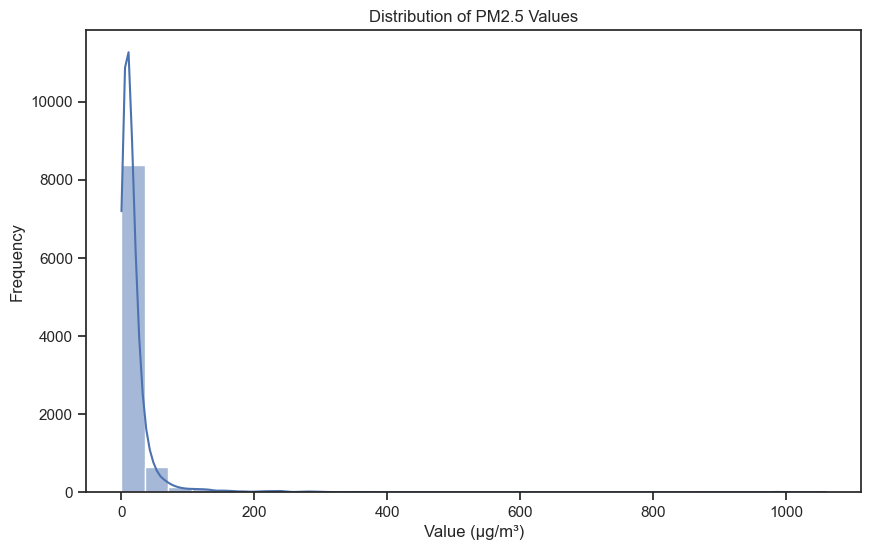

In [774]:
common_pollutant = 'PM2.5'
plt.figure(figsize=(10, 6))
sns.histplot(df[df['Pollutant'] == common_pollutant]['Value_standard'], bins=30, kde=True)
plt.title(f'Distribution of {common_pollutant} Values')
plt.xlabel('Value (µg/m³)')
plt.ylabel('Frequency')
plt.show()

In [775]:
#heat = ttop_countries.pivot_table(index = ttop_countries.value_counts().index, columns="Pollutant", values="Value_standard")

In [776]:
newtop=df[df['Country Label'].isin(df['Country Label'].value_counts().head(10).index)]
newtop.head()

,Country Code,City,Location,Coordinates,Pollutant,Source Name,Unit,Value,Last Updated,Country Label,...,Year,Month,Day,Hour,Date,Conversion,Value_standard,Good_threshold,Bad_threshold,Quality
0,IT,via Pecorelli - Civitavecchia (RM),Civitavecchia- Villa Albani,"42.09929600025972, 11.798339999946897",NO2,eea,µg/m³,34.00,2024-04-13 07:00:00+00:00,Italy,...,2024,4,13,7,2024-04-13,NaN,34.00,25.0,120.0,Regular
1,IT,Area industriale - Polla (SA),Polla Area tritovagliatore,"40.48700999991416, 15.528249999904329",SO2,eea,µg/m³,1.35,2024-04-13 07:00:00+00:00,Italy,...,2024,4,13,7,2024-04-13,NaN,1.35,40.0,125.0,Good
2,IT,via dei Normanni 90 - Acerra (NA),Acerra Zona Industriale,"40.979710000224664, 14.400999999874841",CO,eea,µg/m³,210.00,2024-03-11 10:00:00+00:00,Italy,...,2024,3,11,10,2024-03-11,NaN,210.00,4.0,7.0,Bad
3,IT,via Tagliamonte 18 - Torre Annunziata (NA),Torre Annunziata Scuola Media Pascoli,"40.760599999960604, 14.438150000027823",O3,eea,µg/m³,89.23,2024-04-13 07:00:00+00:00,Italy,...,2024,4,13,7,2024-04-13,NaN,89.23,100.0,160.0,Good
4,IT,via Epomeo - Napoli (NA),Tirrenopower Via Epomeo,"40.84495000021116, 14.205670000204075",PM10,eea,µg/m³,26.81,2024-04-13 07:00:00+00:00,Italy,...,2024,4,13,7,2024-04-13,NaN,26.81,45.0,150.0,Good


In [777]:
newtop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38567 entries, 0 to 55257
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   Country Code    38567 non-null  object             
 1   City            18081 non-null  object             
 2   Location        38565 non-null  object             
 3   Coordinates     38501 non-null  object             
 4   Pollutant       38567 non-null  object             
 5   Source Name     38567 non-null  object             
 6   Unit            38567 non-null  object             
 7   Value           38567 non-null  float64            
 8   Last Updated    38567 non-null  datetime64[ns, UTC]
 9   Country Label   38567 non-null  object             
 10  Latitude        38501 non-null  float64            
 11  Longitude       38501 non-null  float64            
 12  Year            38567 non-null  int64              
 13  Month           38567 non-null 

In [778]:
counrty = newtop[newtop['Country Label']=='China']


In [779]:
counrty.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11113 entries, 119 to 55250
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   Country Code    11113 non-null  object             
 1   City            107 non-null    object             
 2   Location        11113 non-null  object             
 3   Coordinates     11113 non-null  object             
 4   Pollutant       11113 non-null  object             
 5   Source Name     11113 non-null  object             
 6   Unit            11113 non-null  object             
 7   Value           11113 non-null  float64            
 8   Last Updated    11113 non-null  datetime64[ns, UTC]
 9   Country Label   11113 non-null  object             
 10  Latitude        11113 non-null  float64            
 11  Longitude       11113 non-null  float64            
 12  Year            11113 non-null  int64              
 13  Month           11113 non-nul

In [780]:
counrtyPOL=counrty[counrty['Pollutant'].isin(counrty['Pollutant'].value_counts().head(5).index)]


In [781]:
counrtyPOL.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9269 entries, 121 to 55250
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   Country Code    9269 non-null   object             
 1   City            96 non-null     object             
 2   Location        9269 non-null   object             
 3   Coordinates     9269 non-null   object             
 4   Pollutant       9269 non-null   object             
 5   Source Name     9269 non-null   object             
 6   Unit            9269 non-null   object             
 7   Value           9269 non-null   float64            
 8   Last Updated    9269 non-null   datetime64[ns, UTC]
 9   Country Label   9269 non-null   object             
 10  Latitude        9269 non-null   float64            
 11  Longitude       9269 non-null   float64            
 12  Year            9269 non-null   int64              
 13  Month           9269 non-null 

In [782]:
counrtyPOL_pivot = counrtyPOL.pivot_table(index=index,
                          columns='Pollutant',
                          values='Value_standard',
                          aggfunc='max').reset_index()
counrtyPOL_pivot.head()

Pollutant,Country Code,Country Label,Source Name,Latitude,Longitude,Year,Month,Day,Date,Quality,NO2,O3,PM10,PM2.5,SO2
0,CN,China,AirNow,23.116785,113.318088,2024,3,2,2024-03-02,Good,NaN,54.88,NaN,NaN,NaN
1,CN,China,AirNow,23.116785,113.318088,2024,3,2,2024-03-02,Regular,NaN,NaN,NaN,18.0,NaN
2,CN,China,AirNow,30.426029,82.795356,2023,5,2,2023-05-02,Good,NaN,NaN,NaN,NaN,3.668
3,CN,China,AirNow,30.624700,104.068388,2020,5,16,2020-05-16,Regular,NaN,NaN,NaN,23.0,NaN
4,CN,China,AirNow,31.210683,121.448226,2023,5,1,2023-05-01,Regular,NaN,NaN,NaN,28.0,NaN


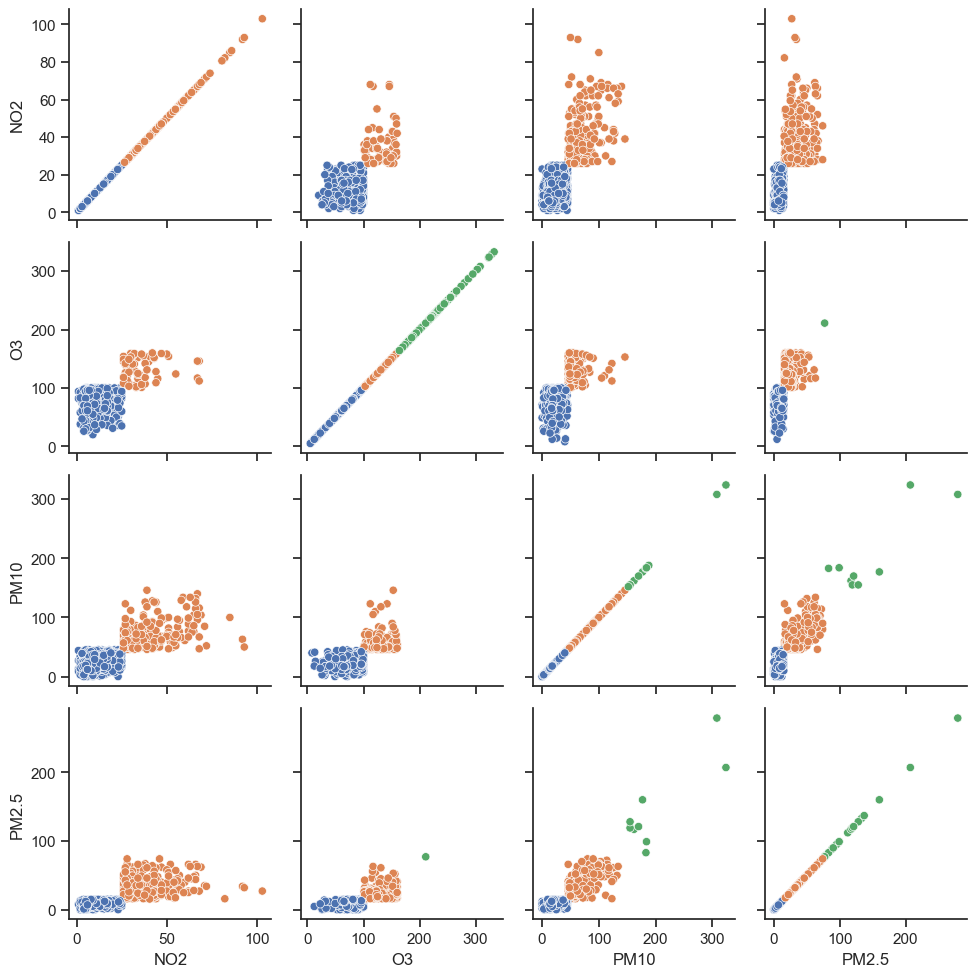

In [783]:
#sns.pairplot(counrtyPOL."Pollutant", hue="Quality")
sns.set_theme(style="ticks")
g = sns.PairGrid(counrtyPOL_pivot, vars=[ 'NO2','O3', 'PM10', 'PM2.5'], hue="Quality")
g.map(sns.scatterplot)

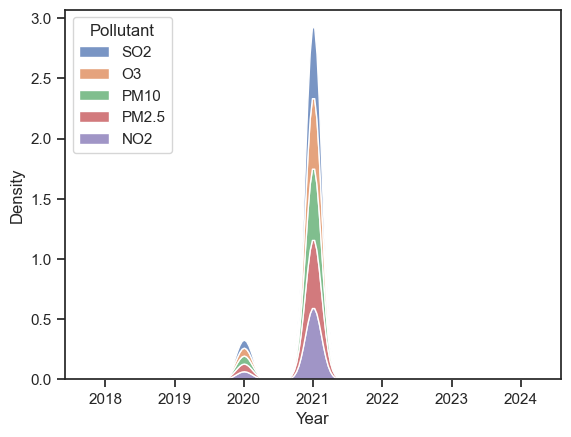

In [784]:
ax = sns.kdeplot(data=counrtyPOL, x="Year", hue='Pollutant', multiple="stack")
sns.move_legend(ax, loc = "upper left")

In [785]:
counrtyPOLyear=counrtyPOL[counrtyPOL['Year'].isin(counrtyPOL['Year'].value_counts().head(1).index)]
counrtyPOLyear.head()

,Country Code,City,Location,Coordinates,Pollutant,Source Name,Unit,Value,Last Updated,Country Label,...,Year,Month,Day,Hour,Date,Conversion,Value_standard,Good_threshold,Bad_threshold,Quality
121,CN,NaN,万安,"24.942399999999996, 118.66629999999999",SO2,ChinaAQIData,µg/m³,1.0,2021-08-09 11:00:00+00:00,China,...,2021,8,9,11,2021-08-09,NaN,1.0,40.0,125.0,Good
122,CN,NaN,三元区政府,"26.237799999999996, 117.6028",O3,ChinaAQIData,µg/m³,159.0,2021-08-09 11:00:00+00:00,China,...,2021,8,9,11,2021-08-09,NaN,159.0,100.0,160.0,Regular
124,CN,NaN,三瓦窑,"30.5767, 104.0594",PM10,ChinaAQIData,µg/m³,46.0,2021-08-09 11:00:00+00:00,China,...,2021,8,9,11,2021-08-09,NaN,46.0,45.0,150.0,Regular
125,CN,NaN,世纪城,"43.16660000000001, 124.3419",PM2.5,ChinaAQIData,µg/m³,25.0,2021-08-09 11:00:00+00:00,China,...,2021,8,9,11,2021-08-09,NaN,25.0,15.0,75.0,Regular
126,CN,NaN,东四,"39.9289, 116.4174",PM10,ChinaAQIData,µg/m³,43.0,2021-08-09 11:00:00+00:00,China,...,2021,8,9,11,2021-08-09,NaN,43.0,45.0,150.0,Good


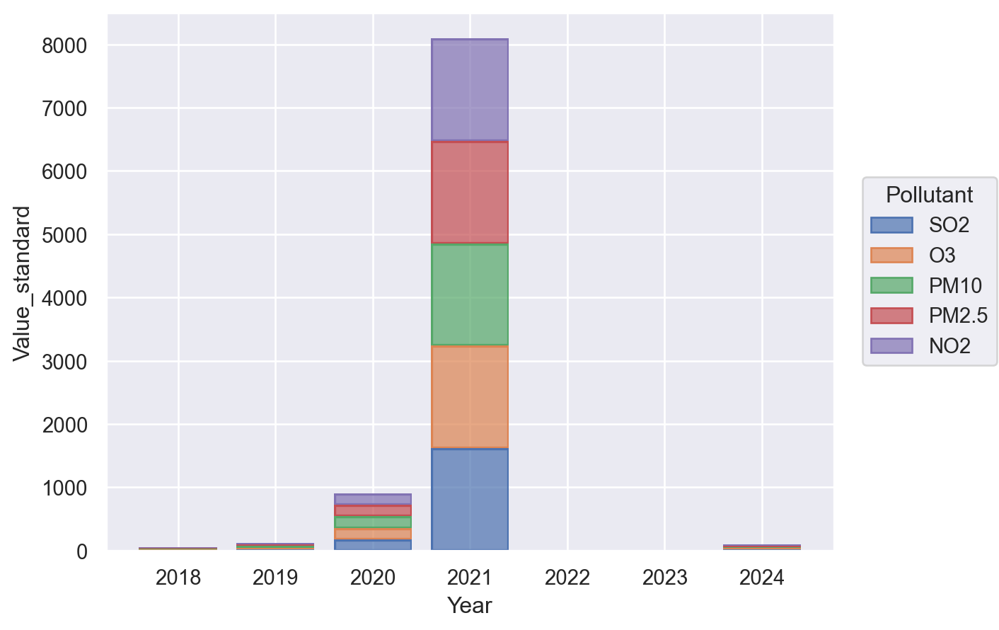

In [786]:
so.Plot(counrtyPOL, "Year", "Value_standard", color="Pollutant").add(so.Bar(), so.Count(), so.Stack())

<Axes: xlabel='Pollutant', ylabel='Value_standard'>

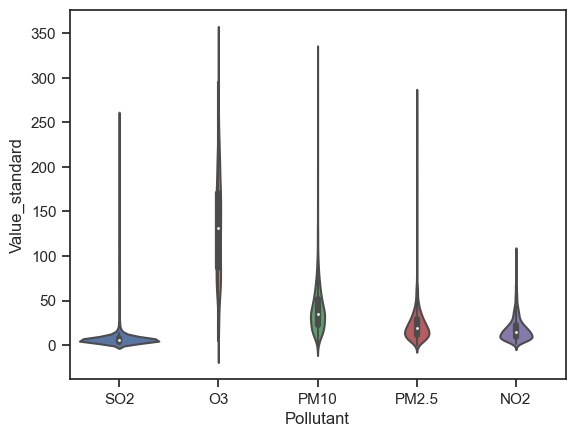

In [787]:
# Load an example dataset with long-form data
densyear = counrtyPOLyear

# Plot the responses for different events and regions
#sns.lineplot(x="Month", y="Value_standard",
 #            hue="Pollutant",
  #           data=densyear)
sns.violinplot(data=counrtyPOL, x="Pollutant", y="Value_standard")

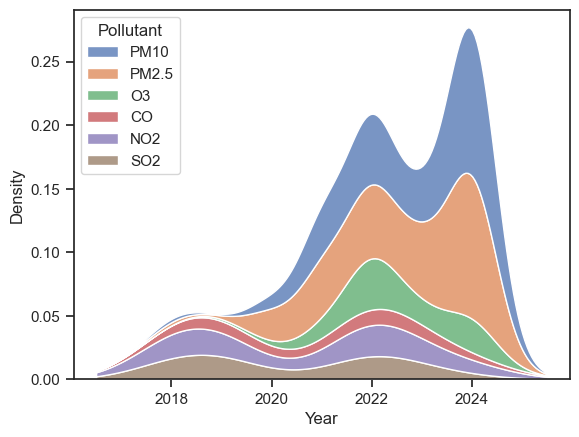

In [788]:
ozonelayer = df[df['Country Label']=='Australia']
#ozonelayer.info()
ax = sns.kdeplot(data=ozonelayer, x="Year", hue='Pollutant', multiple="stack")
sns.move_legend(ax, loc = "upper left")

In [789]:
#sns.displot(data=ozonelayer, x="ozonelayer", hue="Quality", kind="kde")

In [790]:
#sns.pairplot(ozonelayer, hue="species")

<Figure size 1500x700 with 0 Axes>

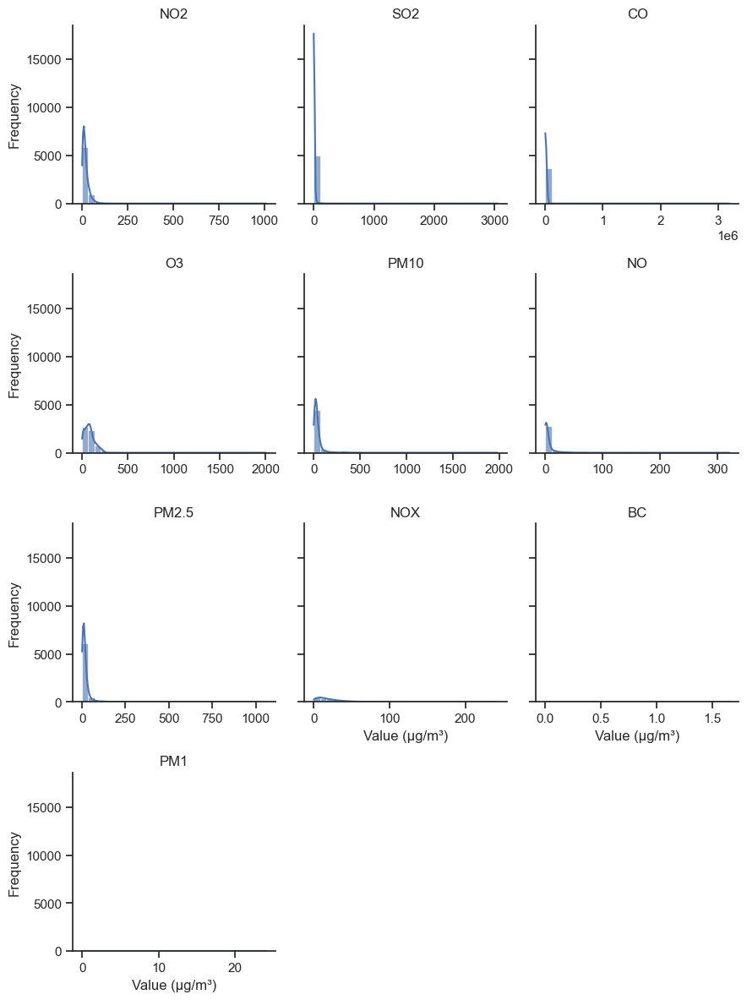

In [791]:
plt.figure(figsize=(15, 7))
g = sns.FacetGrid(newtop, col="Pollutant", col_wrap=3, sharex=False)  # Group by pollutant
g.map(sns.histplot, "Value_standard", kde=True, bins=30, alpha=0.6)
g.set_titles("{col_name}")  # Set titles for each subplot
g.set_xlabels("Value (µg/m³)")
g.set_ylabels("Frequency")
plt.show()

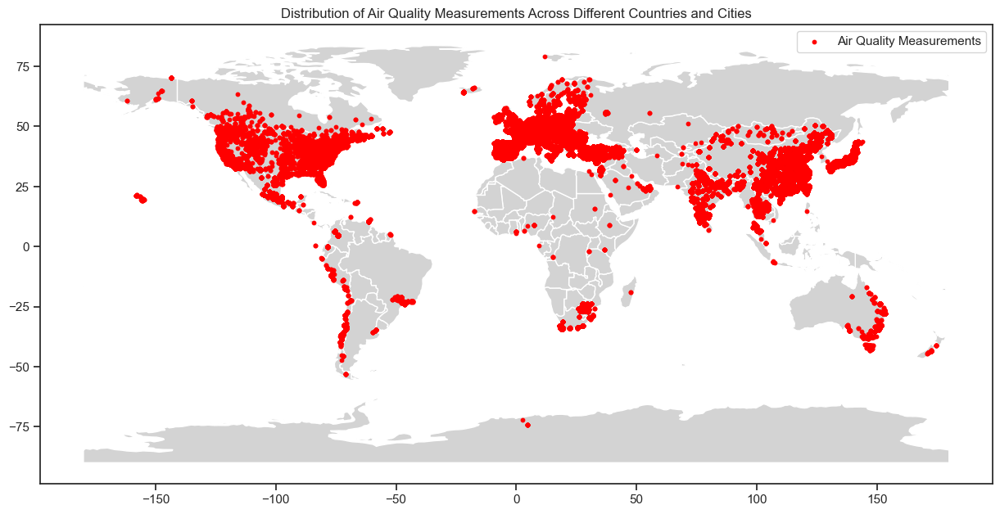

In [792]:
# Creating a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))

# World basemap
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Plotting
fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, color='lightgrey')
gdf.plot(ax=ax, markersize=10, color='red', label='Air Quality Measurements')
plt.title('Distribution of Air Quality Measurements Across Different Countries and Cities')
plt.legend()
plt.show()

In [793]:
# Adjust the concentration values to set a minimum marker size
min_marker_size = 1
max_marker_size = 50
min_concentration = df['Value_standard'].min()
max_concentration = df['Value_standard'].max()

# Scale the concentration values to the desired range for marker sizes
scaled_concentration = (df['Value_standard'] - min_concentration) / (max_concentration - min_concentration)
scaled_concentration = scaled_concentration * (max_marker_size - min_marker_size) + min_marker_size
color_map = {"Good": "green", "Regular": "yellow", "Bad": "red"}
# Create the map visualization with the scaled marker sizes
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude",
                        color="Quality",
                        size=scaled_concentration,
                        hover_name="Pollutant", 
                        hover_data=["Value_standard"],
                        color_discrete_map=color_map,
                        range_color=(min_concentration, max_concentration),
                        zoom=10)

# Update layout to use Mapbox
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})

fig.show()


In [794]:
# Assuming 'aq_data' is your DataFrame
# 'Country.Label' and 'Pollutant' are columns in your DataFrame

# Filtering out rows where 'Country.Label' is not empty
filtered_data = df[df['Country Label'] > ""]

# Grouping by 'Country.Label' and 'Pollutant', then counting occurrences
grouped_data = filtered_data.groupby(['Country Label', 'Pollutant']).size().reset_index(name='Count')

# Sorting the DataFrame by 'Country.Label'
sorted_data = grouped_data.sort_values(by='Country Label')

# Grouping by 'Country.Label' and concatenating unique 'Pollutant' values
grouped_countries = sorted_data.groupby('Country Label')['Pollutant'].apply(lambda x: ', '.join(x.unique())).reset_index()

# Sorting the DataFrame by 'Country.Label'
grouped_countries_sorted = grouped_countries.sort_values(by='Country Label')

print(grouped_countries_sorted)

                Country Label                                   Pollutant
0                 Afghanistan                                       PM2.5
1                     Algeria                                       PM2.5
2                     Andorra           CO, NO, NO2, O3, PM10, PM2.5, SO2
3         Antigua and Barbuda                                       PM2.5
4                   Argentina      SO2, PM2.5, PM10, O3, NOX, NO2, NO, CO
..                        ...                                         ...
107            United Kingdom          PM2.5, PM10, PM1, SO2, NO2, CO, O3
108             United States  SO2, PM2.5, O3, NOX, PM10, NO, CO, BC, NO2
109                Uzbekistan                                   O3, PM2.5
110                  Viet Nam                                       PM2.5
111  West Bank and Gaza Strip                            O3, CO, NO2, SO2

[112 rows x 2 columns]


In [795]:
newtop5=df[df['Country Label'].isin(df['Country Label'].value_counts().head(5).index)]
newtop5p=newtop5[newtop5['Pollutant'].isin(newtop5['Pollutant'].value_counts().head(5).index)]
value = 'Value_standard'
variable = 'Pollutant'
group = 'Country Label'
           
fig = px.line_polar(newtop5p, r = 'Value_standard', theta =  'Pollutant', line_close = True,
                    color = 'Country Label')
fig.update_traces(fill = 'toself')

fig.show()